In [1]:
import scanpy as sc
import anndata as ad
import infercnvpy as cnv 
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
adata = sc.read_h5ad("/data/hanxue/hanxue_data/adata-xwt-annotated.h5ad")
adata

AnnData object with n_obs × n_vars = 159054 × 41733
    obs: 'batch', 'mt_frac', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'n_genes', 'n_counts', 'leiden', 'major_type', 'molecular_type', 'leiden_harmony', 'major_type_harmony', 'minor_type', 'minor-type', 'gender', 'doublet_score', 'predicted_doublet', 'leiden-harmony-female', 'majorType-Female', 'epi-subtype', 'treat', 'leiden-1', 'annotation'
    var: 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'annotation_colors', 'batch_colors', 'dendrogram_annotation', 'dendrogram_leiden', 'dendrogram_leiden-1', 'gender_colors', 'hvg', 'leiden', 'leiden-1_colors', 'leiden-harmony-female_colors', 'leiden_colors', 'leiden_harmony_colors', 'log1p', 'majorType-Female_colors', 'major_type_colors', 'major_type_harmony_colors', 'minor-type_colors', 'minor_

In [3]:
def MergeSubAdata(adata, subAdata, obsName, subObsName):
    obs = pd.Series(list(adata.obs[obsName].copy()), index=adata.obs_names)
    subObs = pd.Series(list(subAdata.obs[subObsName].copy()), index=subAdata.obs_names)
    obs.loc[subObs.index] = subObs
    return pd.DataFrame(obs, columns=[obsName])


def marker(adata, groupby, method='wilcoxon', prefix=''):
    sc.tl.rank_genes_groups(adata, groupby = groupby, method = method)
    sc.tl.dendrogram(adata, groupby=groupby, use_rep='X_pca_harmony')
    sc.pl.rank_genes_groups_dotplot(adata, groupby = groupby, save=prefix+groupby+'.svg')
    return adata

def clu(adata, key_added="majorType-fix", n_neighbors=50, n_pcs=30, rep='X_pca_harmony', do_har=True, max_iter=20, do_scrublet=False, har_key='batch', resolution=1):
    # Computing the neighborhood graph
    if do_scrublet:
        n0 = adata.shape[0]
        print("{0} Cell number: {1}".format(key_added, n0))
        sc.external.pp.scrublet(adata)
        adata = adata[adata.obs['predicted_doublet']==False,:].copy()
        print("{0} Cells retained after scrublet, {1} cells reomved.".format(adata.shape[0], n0-adata.shape[0]))
    else:
        print("Ignoring processing doublet cells...")
    if do_har and len(adata.obs[har_key].cat.categories) > 1:
        sc.external.pp.harmony_integrate(adata, key=har_key,max_iter_harmony=max_iter)
        sc.pp.neighbors(adata, n_neighbors=n_neighbors, n_pcs=n_pcs, use_rep=rep)
    else:
        print("Evaluating neighbors only...")
        sc.pp.neighbors(adata, n_neighbors=n_neighbors, n_pcs=n_pcs, use_rep=rep)
    # Run UMAP
    sc.tl.umap(adata)
    sc.tl.leiden(adata, resolution=resolution, key_added=key_added)
    sc.pl.umap(adata, color=key_added, legend_fontoutline=True, palette=sc.pl.palettes.default_20, legend_loc="on data")
    return adata

In [4]:
# 筛选出内皮
adata_endo = adata[adata.obs['major_type'] == 'Endothelial', :]
adata_endo

View of AnnData object with n_obs × n_vars = 14392 × 41733
    obs: 'batch', 'mt_frac', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'n_genes', 'n_counts', 'leiden', 'major_type', 'molecular_type', 'leiden_harmony', 'major_type_harmony', 'minor_type', 'minor-type', 'gender', 'doublet_score', 'predicted_doublet', 'leiden-harmony-female', 'majorType-Female', 'epi-subtype', 'treat', 'leiden-1', 'annotation'
    var: 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'annotation_colors', 'batch_colors', 'dendrogram_annotation', 'dendrogram_leiden', 'dendrogram_leiden-1', 'gender_colors', 'hvg', 'leiden', 'leiden-1_colors', 'leiden-harmony-female_colors', 'leiden_colors', 'leiden_harmony_colors', 'log1p', 'majorType-Female_colors', 'major_type_colors', 'major_type_harmony_colors', 'minor-type_colors', 

Ignoring processing doublet cells...


2025-09-28 09:28:09,906 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2025-09-28 09:28:12,552 - harmonypy - INFO - sklearn.KMeans initialization complete.
2025-09-28 09:28:12,607 - harmonypy - INFO - Iteration 1 of 20
2025-09-28 09:28:15,648 - harmonypy - INFO - Iteration 2 of 20
2025-09-28 09:28:18,244 - harmonypy - INFO - Iteration 3 of 20
2025-09-28 09:28:21,203 - harmonypy - INFO - Iteration 4 of 20
2025-09-28 09:28:22,822 - harmonypy - INFO - Converged after 4 iterations
/home/hanxue/miniconda3/envs/omicverse/lib/python3.10/site-packages/scanpy/external/pp/_harmony_integrate.py:101: ImplicitModificationWarning: Setting element `.obsm['X_pca_harmony']` of view, initializing view as actual.
  adata.obsm[adjusted_basis] = harmony_out.Z_corr.T
/home/hanxue/miniconda3/envs/omicverse/lib/python3.10/site-packages/numba/np/ufunc/parallel.py:371: NumbaWarning: The TBB threading layer requires TBB version 2021 update 6 or later i.e., TBB_INTERFACE_VERSION >= 12060.

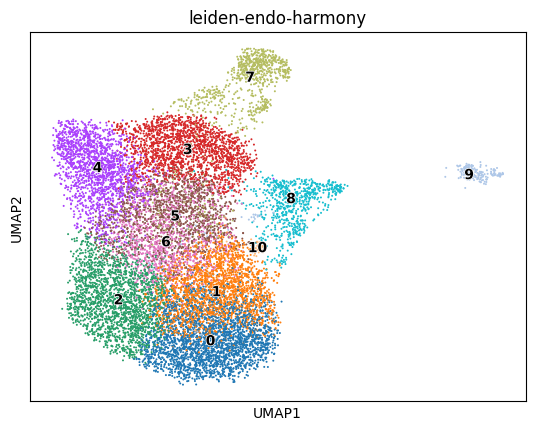

In [5]:
adata_endo = clu(adata_endo, 'leiden-endo-harmony', resolution=1)

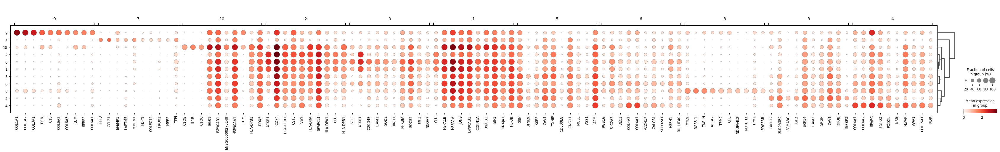

In [9]:
adata_endo = marker(adata_endo, 'leiden-endo-harmony')

categories: 0, 1, 2, etc.
var_group_labels: vascular EC, lymphatic EC, arterial EC, etc.


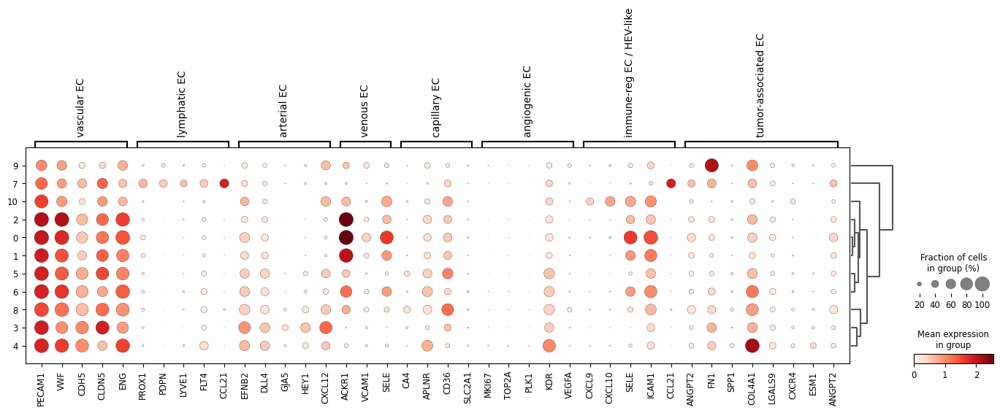

In [13]:
marker_dict = {
    "vascular EC": ["PECAM1", "VWF", "CDH5", "CLDN5", "ENG"], # 血管内皮细胞
    "lymphatic EC": ["PROX1", "PDPN", "LYVE1", "FLT4", "CCL21"], # 淋巴管内皮细胞
    "arterial EC": ["EFNB2", "DLL4", "GJA5", "HEY1", "CXCL12"], # 动脉型血管内皮细胞
    "venous EC": ["ACKR1", "VCAM1", "SELE"],# 静脉型血管内皮细胞
    "capillary EC": ["CA4", "APLNR", "CD36", "SLC2A1"], # 毛细血管型内皮
    "angiogenic EC": ["MKI67", "TOP2A", "PLK1", "KDR", "VEGFA"], # 血管生成型EC
    "immune-reg EC / HEV-like": ["CXCL9", "CXCL10", "SELE", "ICAM1", "CCL21"], # 免疫调控EC / 高内皮微静脉
    "tumor-associated EC": ["ANGPT2", "FN1", "SPP1", "COL4A1", "LGALS9", 'CXCR4', 'ESM1', 'ANGPT2'] # 肿瘤相关内皮细胞
}
sc.pl.dotplot(adata_endo, marker_dict, groupby='leiden-endo-harmony',dendrogram=True) 

categories: 0, 1, 2, etc.
var_group_labels: Endo Vas-venous, Endo Vas-capillary, Endo Vas-arterial, etc.


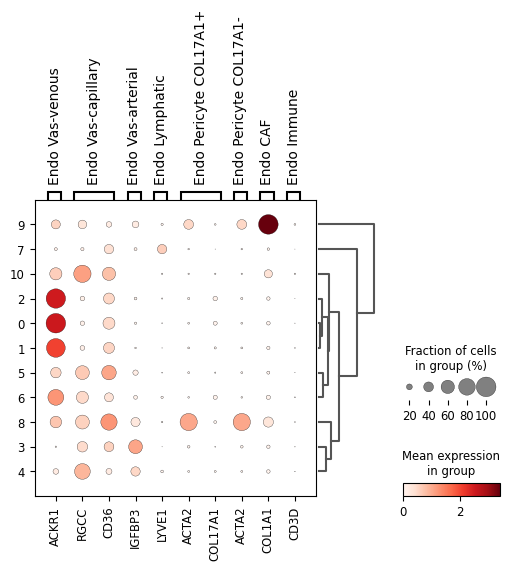

In [14]:
marker_dict = {
    'Endo Vas-venous': ['ACKR1'],
    'Endo Vas-capillary': ['RGCC', 'CD36'],
    'Endo Vas-arterial': ['IGFBP3'],
    'Endo Lymphatic': ['LYVE1'],
    'Endo Pericyte COL17A1+': ['ACTA2', 'COL17A1'],
    'Endo Pericyte COL17A1-': ['ACTA2'],
    'Endo CAF': ['COL1A1'],
    'Endo Immune': ['CD3D']
}
sc.pl.dotplot(adata_endo, marker_dict, groupby='leiden-endo-harmony',dendrogram=True) 

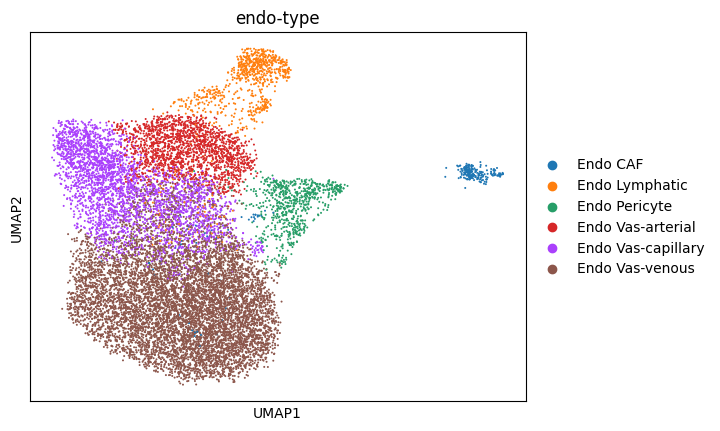

In [6]:
adata_endo.obs['endo-type'] = 'endo unassigned'
# ACKR1
adata_endo.obs.loc[  
    adata_endo.obs["leiden-endo-harmony"].isin(['0', '1', '2', '6']), "endo-type"
] = "Endo Vas-venous"

# RGCC, CD36
adata_endo.obs.loc[
    adata_endo.obs["leiden-endo-harmony"].isin(['4', '5', '10']), "endo-type"
] = "Endo Vas-capillary"

# IGFBP3
adata_endo.obs.loc[  
    adata_endo.obs["leiden-endo-harmony"].isin(['3']), "endo-type"
] = "Endo Vas-arterial"

# LYVE1
adata_endo.obs.loc[
    adata_endo.obs["leiden-endo-harmony"].isin(['7']), "endo-type"
] = "Endo Lymphatic"


# ACTA2, COL17A1-
adata_endo.obs.loc[
    adata_endo.obs["leiden-endo-harmony"].isin(['8']), "endo-type"
] = "Endo Pericyte"

# COL1A1
adata_endo.obs.loc[
    adata_endo.obs["leiden-endo-harmony"].isin(['9']), "endo-type"
] = "Endo CAF"

sc.pl.umap(adata_endo, color="endo-type", legend_fontoutline=True, palette=sc.pl.palettes.default_20, save = '-Endo.svg')

In [ ]:
sc.tl.rank_genes_groups(adata_endo, groupby='endo-type', method='wilcoxon')
sc.tl.dendrogram(adata_endo, groupby='endo-type')
sc.pl.rank_genes_groups_dotplot(adata_endo, groupby='endo-type', n_genes=5, save='-Endo.svg')

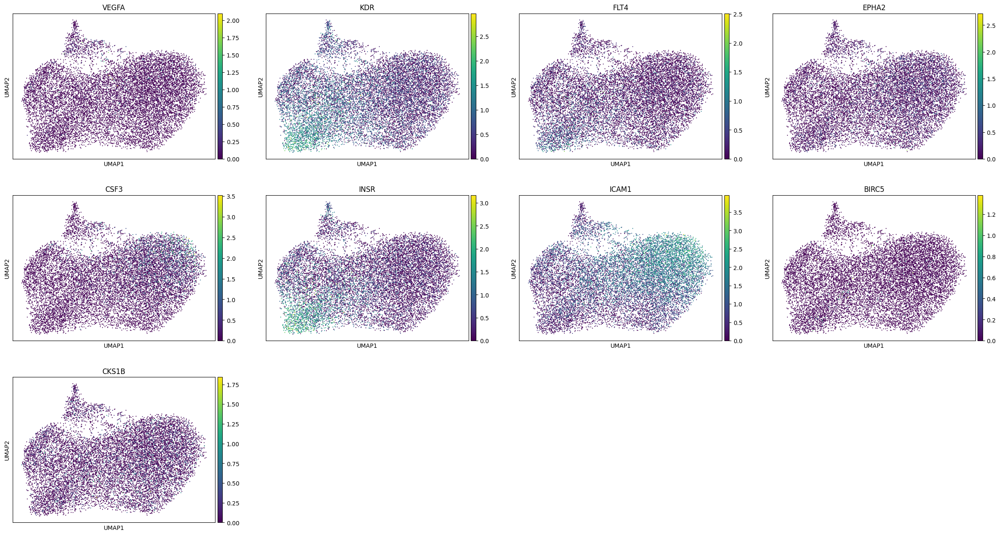

In [121]:
#   "PECAM1", "VWF", "CDH5", # 结构蛋白
#    "TEK", "ANGPT1", "CD34", # 稳定血管功能
#    "KDR", "FLT4", "EPHA2", "VEGFA", # 促血管生成 
#    "H1F1A", "CSF3", # 代谢及缺氧响应
#    "CD105", "ITGAV", "ITGB3","TEM1", "TEM9", "TEM17", # 细胞表面标记
# "INSR", "ICAM1","BIRC5", "CKS1B"

sc.pl.umap(adata_endo, color=['VEGFA', 'KDR', 'FLT4', 'EPHA2', 'CSF3', 'INSR', 'ICAM1', 'BIRC5', 'CKS1B'])

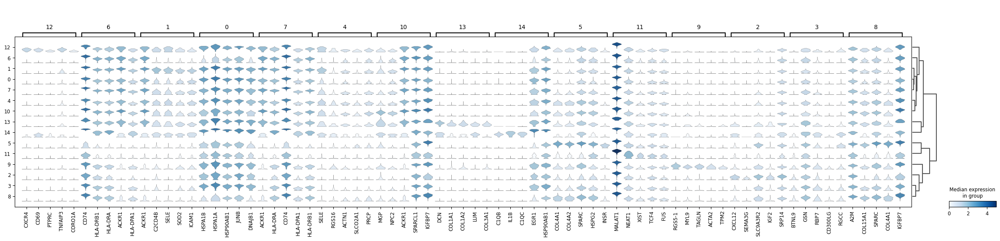

In [122]:
sc.tl.rank_genes_groups(adata_endo, groupby='leiden-endo',method='wilcoxon')
sc.tl.dendrogram(adata_endo, groupby='leiden-endo')
sc.pl.rank_genes_groups_stacked_violin(adata_endo, n_genes=5, groupby='leiden-endo')

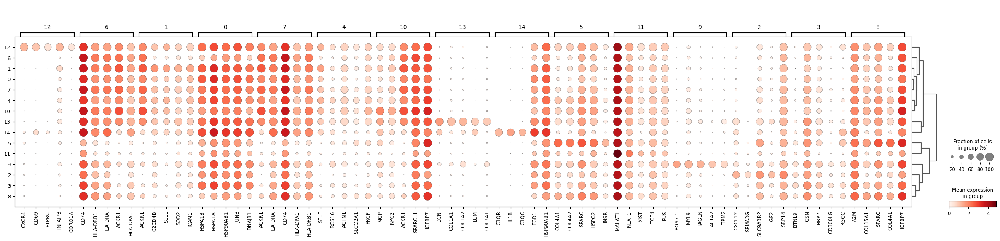

In [123]:
sc.pl.rank_genes_groups_dotplot(adata_endo, n_genes=5, groupby='leiden-endo')

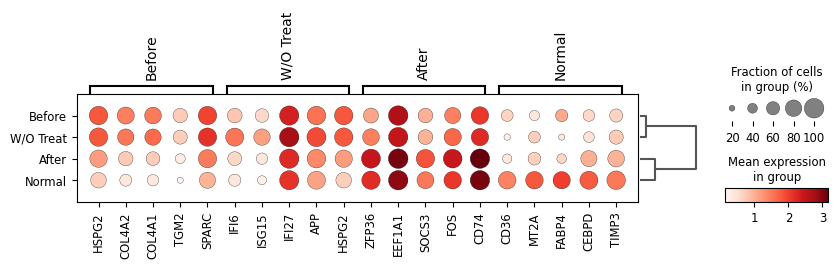

In [124]:
sc.tl.rank_genes_groups(adata_endo, groupby='treat',method='wilcoxon')
sc.tl.dendrogram(adata_endo, groupby='treat')
sc.pl.rank_genes_groups_dotplot(adata_endo, n_genes=5, groupby='treat')

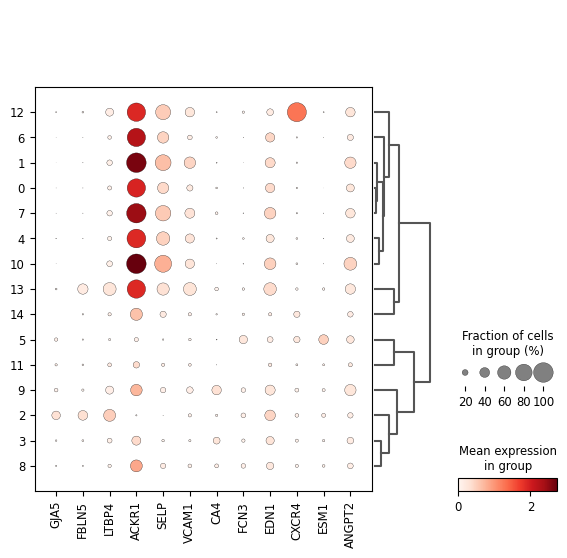

In [145]:
sc.pl.dotplot(adata_endo, var_names=['GJA5', 'FBLN5', 'LTBP4','ACKR1', 'SELP', 'VCAM1', 'CA4', 'FCN3', 'EDN1', 'CXCR4', 'ESM1', 'ANGPT2'], groupby = 'leiden-endo', dendrogram=True)

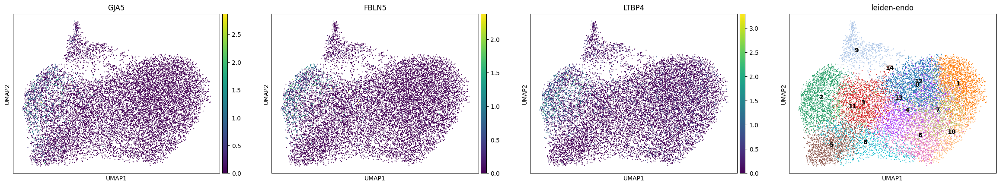

In [128]:
# 动脉ECs marker
sc.pl.umap(adata_endo, color=['GJA5', 'FBLN5', 'LTBP4', 'leiden-endo'], legend_loc= "on data")
# 2

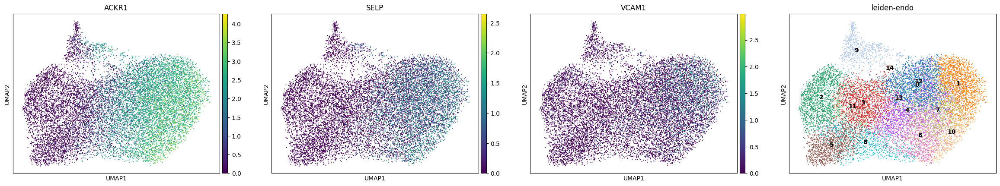

In [129]:
# 静脉ECs
sc.pl.umap(adata_endo, color=['ACKR1', 'SELP', 'VCAM1', 'leiden-endo'], legend_loc= "on data")
# 0 1 3 4 6 7 8 10 12 13 14

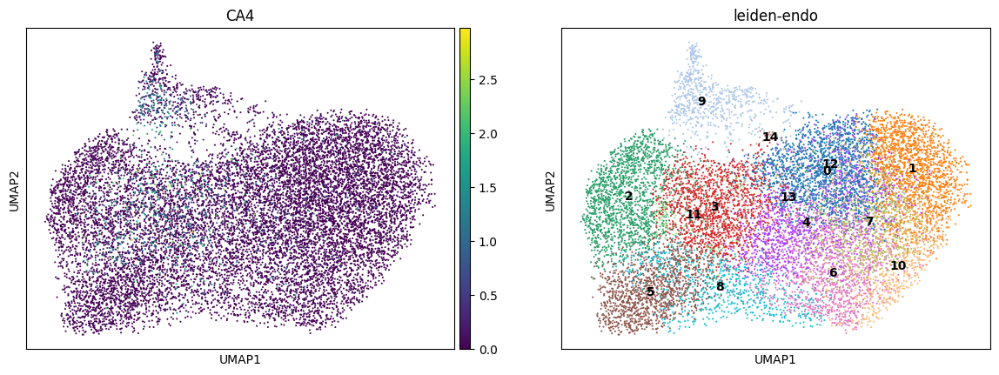

In [130]:
# 毛细EC
sc.pl.umap(adata_endo, color=['CA4', 'leiden-endo'], legend_loc= "on data")
# 9 11

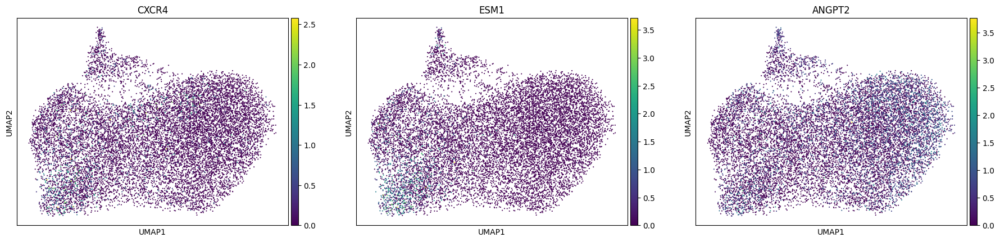

In [131]:
# 尖端样EC (tip-like 主要在癌症中)
sc.pl.umap(adata_endo, color=['CXCR4', 'ESM1', 'ANGPT2'], legend_loc= "on data")
# 5

In [146]:
adata_endo.obs['anno-endo'] = 'Unkonwn'
adata_endo.obs.loc[  
    adata_endo.obs["leiden-endo"] == '2', "anno-endo"
] = "arterial_ECs"
adata_endo.obs.loc[  
    adata_endo.obs["leiden-endo"].isin(['0', '1', '3', '4', '6', '7', '8', '10', '11', '12', '13', '14']), "anno-endo"
] = "venous_ECs"
adata_endo.obs.loc[  
    adata_endo.obs["leiden-endo"].isin(['9']), "anno-endo"
] = "capillary_ECs"
adata_endo.obs.loc[  
    adata_endo.obs["leiden-endo"].isin(['5']), "anno-endo"
] = "tip_like_ECs"

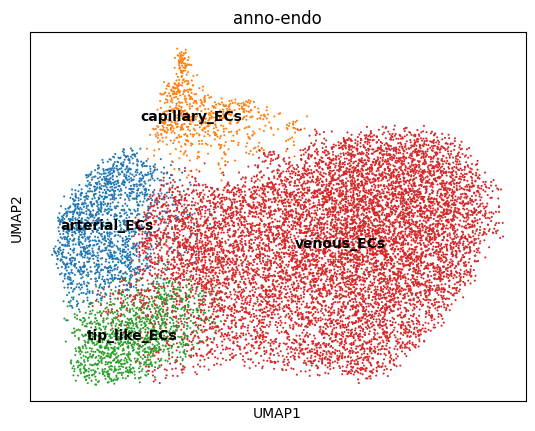

In [147]:
sc.pl.umap(adata_endo, color=['anno-endo'], legend_loc= "on data")

/tmp/ipykernel_236850/1433122259.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  cell_type_counts = adata_endo.obs.groupby(['batch', 'endo-type']).size().unstack(fill_value=0)


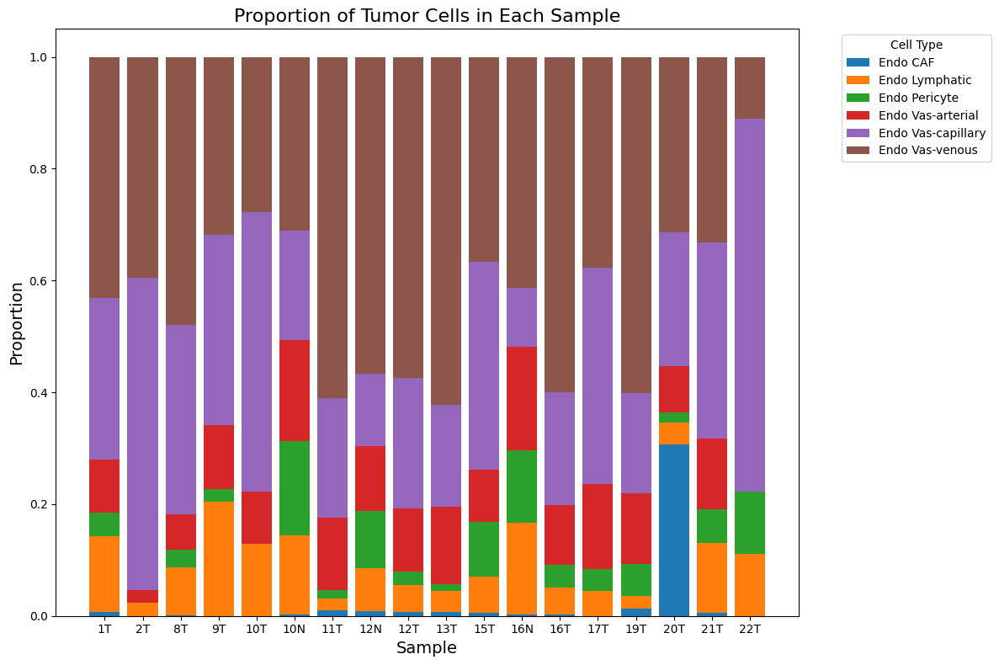

In [16]:
# 1. 计算每个样本中每种细胞类型的数量
cell_type_counts = adata_endo.obs.groupby(['batch', 'endo-type']).size().unstack(fill_value=0)

# 2. 计算每个样本的总细胞数
sample_totals = cell_type_counts.sum(axis=1)

# 3. 计算每种细胞类型在每个样本中的占比
proportions = cell_type_counts.div(sample_totals, axis=0)

# 4. 绘制堆叠条形图
fig, ax = plt.subplots(figsize=(12, 8))

# 遍历每个细胞类型，逐层堆叠
bottom = np.zeros(len(cell_type_counts.index))  # 初始化底部高度
for cell_type in proportions.columns:
    ax.bar(proportions.index, proportions[cell_type], bottom=bottom, label=cell_type)
    bottom += proportions[cell_type]  # 更新底部高度

# 添加标题和标签
ax.set_title('Proportion of Tumor Cells in Each Sample', fontsize=16)
ax.set_xlabel('Sample', fontsize=14)
ax.set_ylabel('Proportion', fontsize=14)
ax.legend(title='Cell Type', bbox_to_anchor=(1.05, 1), loc='upper left')

# 显示图形
plt.tight_layout()
plt.show()

In [12]:
adata_endo_tumor = adata_endo[adata_endo.obs['treat'] != 'Normal', :]

/home/hanxue/miniconda3/envs/scseq/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:645: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}


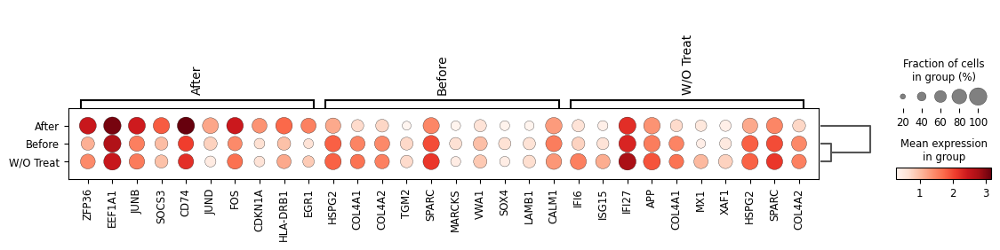

In [136]:
sc.tl.rank_genes_groups(adata_endo_tumor, groupby='treat',method='wilcoxon')
sc.tl.dendrogram(adata_endo_tumor, groupby='treat')
sc.pl.rank_genes_groups_dotplot(adata_endo_tumor, n_genes=10, groupby='treat')

In [10]:
import gseapy as gp
from gseapy import Msigdb
msig = Msigdb()
gmt = msig.get_gmt(category='mh.all', dbver="2023.2.Hs")
gmt

In [13]:
# get deg result
result = adata_endo_tumor.uns['rank_genes_groups']
groups = result['names'].dtype.names
degs = pd.DataFrame(
    {group + '_' + key: result[key][group]
    for group in groups for key in ['names','scores', 'pvals','pvals_adj','logfoldchanges']})
degs

,After_names,After_scores,After_pvals,After_pvals_adj,After_logfoldchanges,Before_names,Before_scores,Before_pvals,Before_pvals_adj,Before_logfoldchanges,Normal_names,Normal_scores,Normal_pvals,Normal_pvals_adj,Normal_logfoldchanges,W/O Treat_names,W/O Treat_scores,W/O Treat_pvals,W/O Treat_pvals_adj,W/O Treat_logfoldchanges
0,ZFP36,38.650135,0.000000e+00,0.000000e+00,1.270128,HSPG2,26.708315,3.768354e-157,2.246639e-153,1.235870,CD36,48.840065,0.000000e+00,0.000000e+00,2.694069,IFI6,37.476093,2.258499e-307,9.425394e-303,2.199377
1,EEF1A1,35.861828,1.203029e-281,2.510301e-277,0.491085,COL4A2,25.235399,1.638243e-140,6.215344e-137,1.548496,MT2A,43.936409,0.000000e+00,0.000000e+00,2.476000,ISG15,30.269341,2.903987e-201,3.029803e-197,2.186575
2,SOCS3,35.114479,4.053174e-270,5.638371e-266,1.122079,COL4A1,25.064709,1.206932e-138,3.597777e-135,1.677441,FABP4,43.119541,0.000000e+00,0.000000e+00,2.871542,IFI27,29.637327,4.940126e-193,4.123325e-189,0.844322
3,FOS,31.897539,2.888237e-223,3.013370e-219,1.056058,TGM2,21.569796,3.452199e-103,5.762824e-100,1.582237,CEBPD,40.984173,0.000000e+00,0.000000e+00,1.735189,APP,28.655308,1.376629e-180,9.575145e-177,1.032976
4,CD74,28.868923,2.932871e-183,2.039958e-179,0.897036,SPARC,20.894703,5.982673e-97,9.247219e-94,0.917546,TIMP3,35.042187,5.128740e-269,4.280754e-265,1.245311,HSPG2,25.283960,4.795290e-141,1.334145e-137,1.222780
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41728,SLC9A3R2,-18.662491,9.996187e-78,9.068932e-75,-0.650720,EGR1,-27.599806,1.118683e-167,9.337199e-164,-2.015107,PRCP,-26.443666,4.315192e-154,9.478205e-151,-1.442469,JUNB,-26.330460,8.593365e-153,3.984743e-149,-1.240753
41729,MT2A,-20.772850,7.619973e-96,1.060015e-92,-1.142005,HLA-DRB1,-28.600914,6.545157e-180,6.828726e-176,-1.446020,HTRA1,-28.151747,2.281196e-174,6.800081e-171,-1.960563,ZFP36,-26.475332,1.864657e-154,9.727217e-151,-1.448446
41730,DDIT4,-21.890665,3.188320e-106,5.785136e-103,-0.986924,CD74,-29.944134,5.246005e-197,7.297718e-193,-1.550436,IGFBP7,-30.054588,1.901812e-198,8.818702e-195,-0.894205,EIF1,-27.892769,3.265268e-171,1.946706e-167,-0.870249
41731,FABP4,-27.429108,1.233520e-165,6.434811e-162,-1.728840,DUSP1,-33.340832,9.892537e-244,2.064226e-239,-1.799532,SPARC,-32.851070,1.099688e-236,5.736662e-233,-1.310102,EEF1A1,-31.970303,2.821843e-224,3.925466e-220,-0.794054


In [14]:
# subset up or down regulated genes
degs_sig = degs[degs.After_pvals_adj < 0.05]
degs_up = degs_sig[degs_sig.After_logfoldchanges > 0.5]
degs_dw = degs_sig[degs_sig.After_logfoldchanges < -0.5]

In [15]:
enr_up = gp.enrichr(degs_up.After_names,
                    gene_sets='KEGG_2021_Human',
                    outdir=None)
cc_up = gp.enrichr(degs_up.After_names,
                    gene_sets='GO_Cellular_Component_2023',
                    outdir=None)
bp_up = gp.enrichr(degs_up.After_names,
                    gene_sets='GO_Biological_Process_2023',
                    outdir=None)
mf_up = gp.enrichr(degs_up.After_names,
                    gene_sets='GO_Molecular_Function_2023',
                    outdir=None)
hm_up = gp.enrichr(degs_up.After_names,
                    gene_sets='MSigDB_Hallmark_2020',
                    outdir=None)

In [16]:
enr_down = gp.enrichr(degs_dw.After_names,
                    gene_sets='KEGG_2021_Human',
                    outdir=None)
cc_down = gp.enrichr(degs_dw.After_names,
                    gene_sets='GO_Cellular_Component_2023',
                    outdir=None)
bp_down = gp.enrichr(degs_dw.After_names,
                    gene_sets='GO_Biological_Process_2023',
                    outdir=None)
mf_down = gp.enrichr(degs_dw.After_names,
                    gene_sets='GO_Molecular_Function_2023',
                    outdir=None)
hm_down = gp.enrichr(degs_dw.After_names,
                    gene_sets='MSigDB_Hallmark_2020',
                    outdir=None)

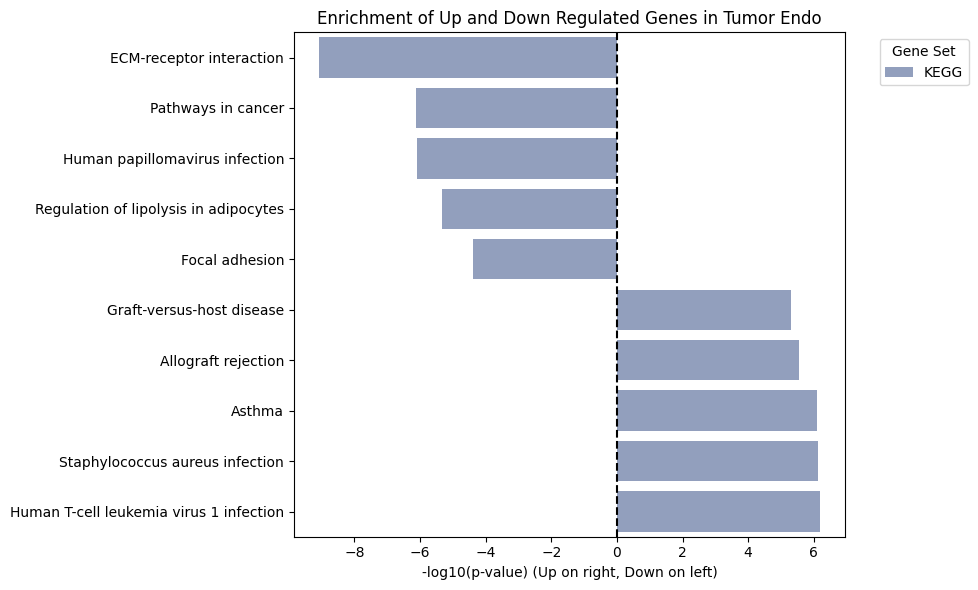

In [25]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# 拼接所有up和down富集结果
def prepare_df(df, label):
    df = df.copy()
    df['Gene_set'] = label
    return df

# 合并top15条目来自每个数据库
df_up = pd.concat([
    prepare_df(enr_up.res2d.head(5), 'KEGG')
])
df_down = pd.concat([
    prepare_df(enr_down.res2d.head(5), 'KEGG')
])

# 添加方向、统一-log10(pval)
df_up['Direction'] = 'Up'
df_up['logp'] = -np.log10(df_up['P-value'])

df_down['Direction'] = 'Down'
df_down['logp'] = np.log10(df_down['P-value'])  # 注意：下调做正方向方便镜像

# 合并并整理
df_all = pd.concat([df_up, df_down])
df_all['Term'] = df_all['Term'].str.replace('_', ' ')
df_all['Term'] = df_all['Term'].str[:60]  # 避免标签过长

# 设置颜色
palette = {
    'KEGG': '#8b9cc4'
}

# 排序绘图
df_all = df_all.sort_values('logp')
plt.figure(figsize=(10, 6))

# 条形图
sns.barplot(
    data=df_all,
    y='Term',
    x='logp',
    hue='Gene_set',
    palette=palette,
    dodge=False
)

# 设置参考线与图例
plt.axvline(0, color='black', linestyle='--')
plt.xlabel('-log10(p-value) (Up on right, Down on left)')
plt.ylabel('')
plt.title("Enrichment of Up and Down Regulated Genes in Tumor Endo")
plt.legend(title='Gene Set', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.savefig("figures/After_Endo_KEGG_Enrichment_UPvsDOWN.svg")
plt.show()

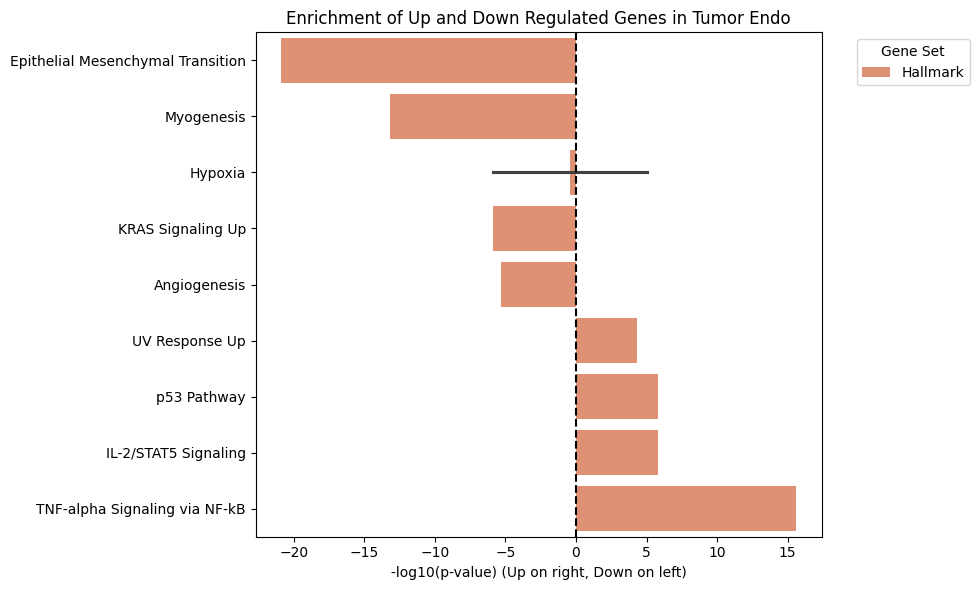

In [26]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# 拼接所有up和down富集结果
def prepare_df(df, label):
    df = df.copy()
    df['Gene_set'] = label
    return df

# 合并top15条目来自每个数据库
df_up = pd.concat([
    prepare_df(hm_up.res2d.head(5), 'Hallmark')
])
df_down = pd.concat([
    prepare_df(hm_down.res2d.head(5), 'Hallmark')
])

# 添加方向、统一-log10(pval)
df_up['Direction'] = 'Up'
df_up['logp'] = -np.log10(df_up['P-value'])

df_down['Direction'] = 'Down'
df_down['logp'] = np.log10(df_down['P-value'])  # 注意：下调做正方向方便镜像

# 合并并整理
df_all = pd.concat([df_up, df_down])
df_all['Term'] = df_all['Term'].str.replace('_', ' ')
df_all['Term'] = df_all['Term'].str[:60]  # 避免标签过长

# 设置颜色
palette = {
    'Hallmark': '#f08961'
}

# 排序绘图
df_all = df_all.sort_values('logp')
plt.figure(figsize=(10, 6))

# 条形图
sns.barplot(
    data=df_all,
    y='Term',
    x='logp',
    hue='Gene_set',
    palette=palette,
    dodge=False
)

# 设置参考线与图例
plt.axvline(0, color='black', linestyle='--')
plt.xlabel('-log10(p-value) (Up on right, Down on left)')
plt.ylabel('')
plt.title("Enrichment of Up and Down Regulated Genes in Tumor Endo")
plt.legend(title='Gene Set', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.savefig("figures/After_Endo_Hallmark_Enrichment_UPvsDOWN.svg")
plt.show()

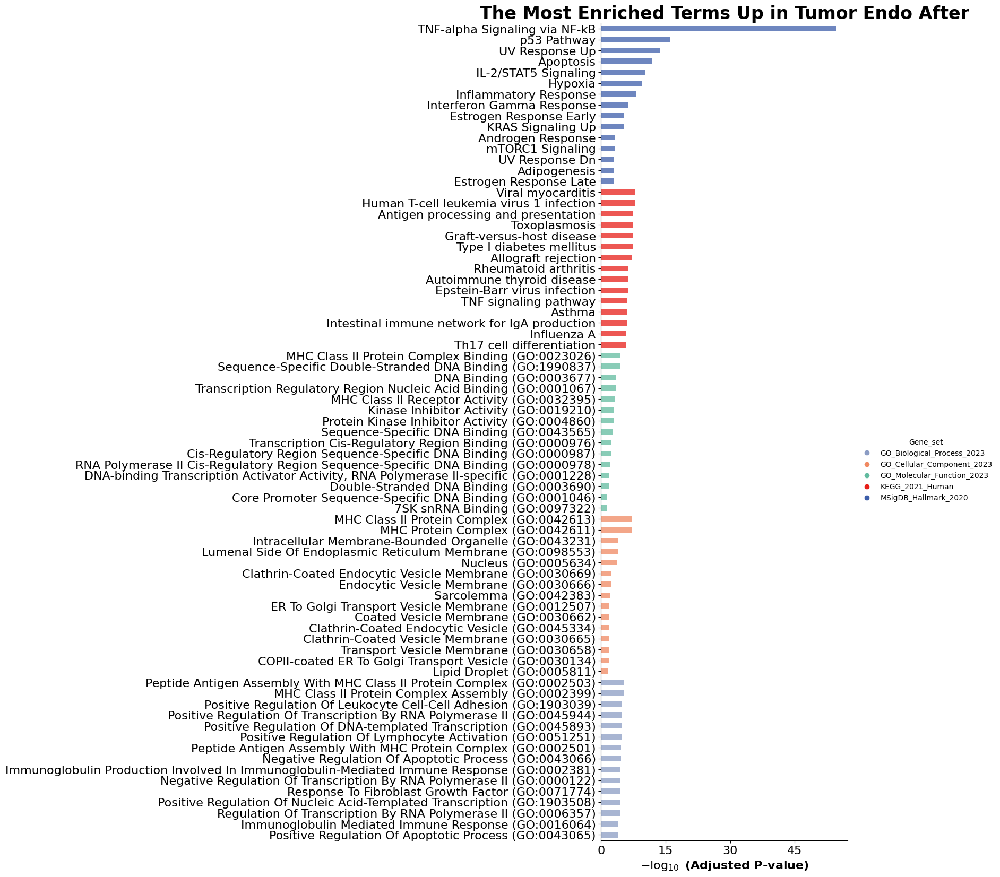

In [142]:
go_res = pd.concat([enr_up.res2d.head(15),hm_up.res2d.head(15), cc_up.res2d.head(15), bp_up.res2d.head(15), mf_up.res2d.head(15)])
ax = gp.barplot(go_res, figsize=(6,20),
                group ='Gene_set',
                top_term=15,
                color = ['#8b9cc4', '#f08961', '#62bb9f', '#e71f19', '#3d5eaa'],
                title ="The Most Enriched Terms Up in Tumor Endo After")
ax.figure.savefig(f"figures/Endo_After_Enrichment_UP.svg")

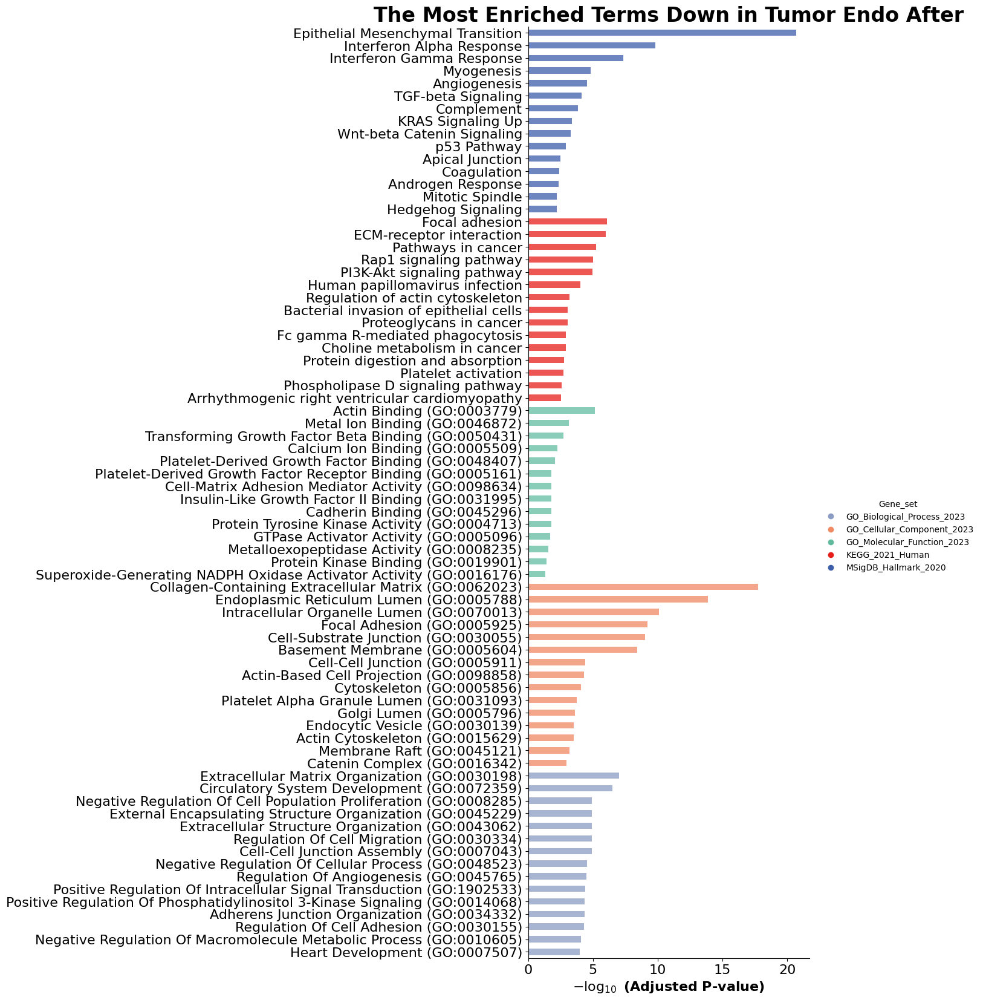

In [143]:
godown_res = pd.concat([enr_down.res2d.head(15),hm_down.res2d.head(15), 
                    cc_down.res2d.head(15), bp_down.res2d.head(15), mf_down.res2d.head(15)])
ax = gp.barplot(godown_res, figsize=(6,20),
                group ='Gene_set',
                top_term=15,
                color = ['#8b9cc4', '#f08961', '#62bb9f', '#e71f19', '#3d5eaa'],
                title ="The Most Enriched Terms Down in Tumor Endo After")
ax.figure.savefig(f"figures/Endo_After_Enrichment_DOWN.svg")

In [ ]:
sc.pl.dotplot(adata_endo, var_names=['TNFR1', 'TNFR2'], groupby='treat')

: 

In [17]:
adata_endo.write_h5ad("adata-endo.h5ad")
